# Method 1

In [4]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import skimage.io
import skimage.segmentation
import matplotlib.pyplot as plt
from glob import glob

%matplotlib inline
plt.rcParams['figure.figsize']=10,10
# Any results you write to the current directory are saved as output.

In [6]:
from subprocess import check_output
print(check_output(["ls", "data/bowl18/"]).decode("utf8"))

stage1_sample_submission.csv
stage1_test
stage1_train
stage1_train_labels.csv



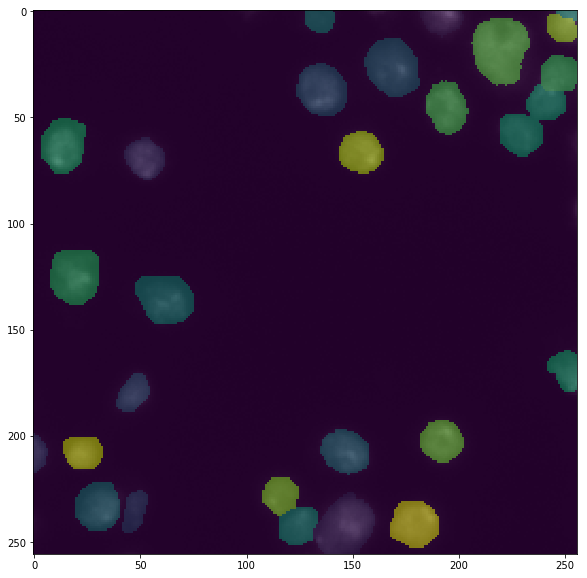

In [7]:
# Load a single image and its associated masks
id = '0a7d30b252359a10fd298b638b90cb9ada3acced4e0c0e5a3692013f432ee4e9'
file = "data/bowl18/stage1_train/{}/images/{}.png".format(id,id)
masks = "data/bowl18/stage1_train/{}/masks/*.png".format(id)
image = skimage.io.imread(file)
masks = skimage.io.imread_collection(masks).concatenate()
height, width, _ = image.shape
num_masks = masks.shape[0]

# Make a ground truth label image (pixel value is index of object label)
labels = np.zeros((height, width), np.uint16)
for index in range(0, num_masks):
    labels[masks[index] > 0] = index + 1
    
plt.imshow(image)
plt.imshow(labels,alpha=0.5)

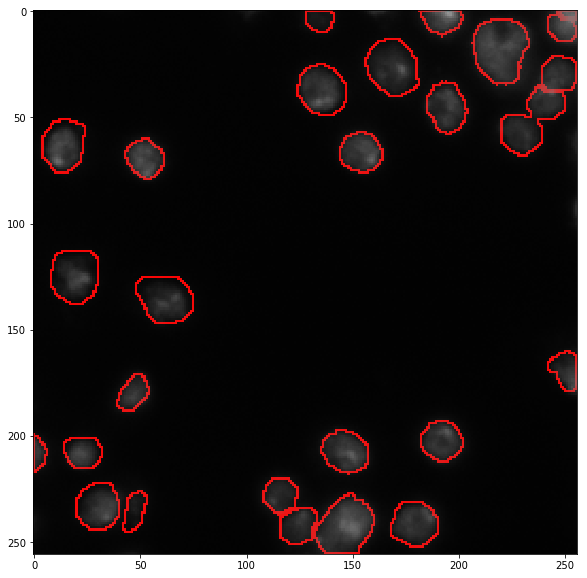

In [8]:
def getContour(mask):
    ### generate bound
    mask_pad=np.pad(mask,((1,1),(1,1)),'constant')
    h,w=mask.shape
    contour=np.zeros((h,w),dtype=np.bool)
    for i in range(3):
        for j in range(3):
            if i==j==1:
                continue
            edge=(np.float32(mask)-np.float32(mask_pad[i:i+h,j:j+w]))>0
            contour=np.logical_or(contour,edge)
    return contour

def showContour(image,contours):
    vis=np.copy(image)
    for contour in contours:
        vis[:,:,0]^=np.uint8(contour*255)
    plt.imshow(vis)
    
contours = [getContour(mask) for mask in masks]
showContour(image,contours)

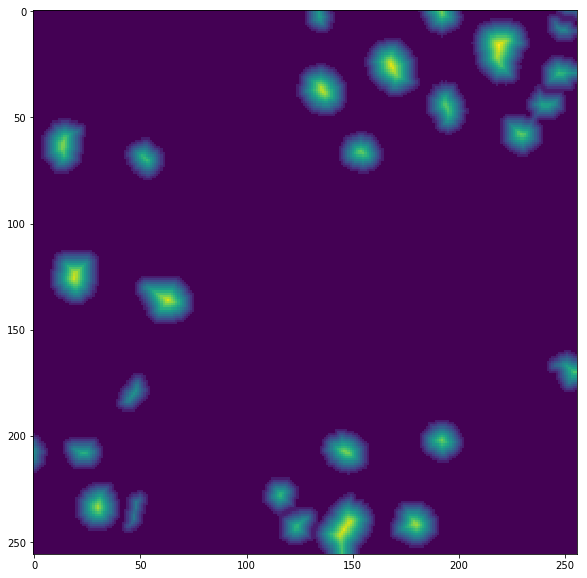

In [9]:
from scipy.ndimage.morphology import distance_transform_edt

edts=[distance_transform_edt(mask) for mask in masks]
plt.imshow(np.sum(edts,axis=0))

# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # 

# Method 2 
Read a random subset of 16 images from the training data set and shows them along with their nuclei mask contours.

Total Images in Training set: 670
Randomly Selected Images: 16, their IDs: ['ef3ef194e5657fda708ecbd3eb6530286ed2ba23c88efb9f1715298975c73548', '4596961c789d3b41916492918797724fe75128239fefc516c3ee75322b7926f0', '431b9b0c520a28375b5a0c18d0a5039dd62cbca7c4a0bcc25af3b763d4a81bec', '0acd2c223d300ea55d0546797713851e818e5c697d073b7f4091b96ce0f3d2fe', 'e5f8ad0f0a43af8ca57e31e16800108abdfb44a7e962a71d246f72d2dbde42bf', '813f41ef376c3cbcc9d6e2ce6a51c2ee068226d1c1b13404eb238dcfdd447c97', '7ac468eb217b7058d22c1711285d21949b4121bf3fa3217e3e51453666ebecff', '538b7673d507014d83af238876e03617396b70fe27f525f8205a4a96900fbb8e', '79fe419488ba98494e3baa35c6fef9662eda1efe325d0ab0ac002f5383245d96', 'a6515d73077866808ad4cb837ecdac33612527b8a1041e82135e40fce2bb9380', '193ffaa5272d5c421ae02130a64d98ad120ec70e4ed97a72cdcd4801ce93b066', '876423522bdec1602917b94163a21e05fc7b692045219b7bc96cdaf638c33c25', 'b909aa8f6f4bec37c3fb6ff5a85d166162d07983506fcc57be742b0f9dbafbf7', '7ba20aa731cc21af74a8d940254176cbad1bdc4

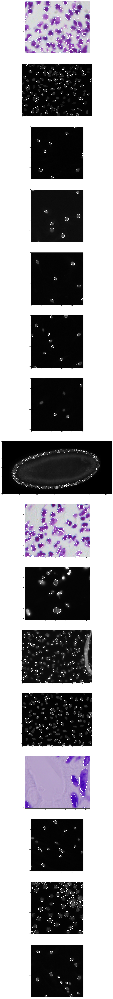

In [11]:
from skimage import morphology

def read_image_labels(image_id):
    # most of the content in this function is taken from 'Example Metric Implementation' kernel 
    # by 'William Cukierski'
    image_file = "data/bowl18/stage1_train/{}/images/{}.png".format(image_id,image_id)
    mask_file = "data/bowl18/stage1_train/{}/masks/*.png".format(image_id)
    image = skimage.io.imread(image_file)
    masks = skimage.io.imread_collection(mask_file).concatenate()    
    height, width, _ = image.shape
    num_masks = masks.shape[0]
    maxValue = np.max(image)
    for index in range(0, num_masks):
        contour = np.logical_xor(masks[index], morphology.binary_erosion(masks[index]) )
        image[contour > 0] = maxValue
    return image

def plot_images_masks(image_ids):
    plt.close('all')
    fig, ax = plt.subplots(nrows=len(image_ids),ncols=1, figsize=(256,256))
    for ax_index, image_id in enumerate(image_ids):
        image = read_image_labels(image_id)
        ax[ax_index].imshow(image)

image_ids = check_output(["ls", "data/bowl18/stage1_train/"]).decode("utf8").split()
print("Total Images in Training set: {}".format(len(image_ids)))
random_image_ids = random.sample(image_ids, 16)
print("Randomly Selected Images: {}, their IDs: {}".format(len(random_image_ids), random_image_ids))
plot_images_masks(random_image_ids)

# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # 

# Method 3
Same as above but in smaller size

Total Images in Training set: 670
Randomly Selected Images: 16, their IDs: ['fe80a2cf3c93dafad8c364fdd1646b0ba4db056cdb7bdb81474f957064812bba', '700afb1cd830a808e3c6125749612e5d23fd9f9726049a9e0c2061997514e1a7', '5d2c98fd6fda3c7d739461c3b3d4a0c7f8456121a14519dc5955a1775227b053', '8f6e49e474ebb649a1e99662243d51a46cc9ba0c9c8f1efe2e2b662a81b48de1', '371a67232f7c871ec11332292c83cd9bb16063b91d58e86f0b76ef8817bc9465', 'af576e8ec3a8d0b57eb6a311299e9e4fd2047970d3dd9d6f52e54ea6a91109da', '351771edfc5db5665ded8aa4940257276b6526663c76e3b60b92a52584d8943c', '6b72b61b80060a9e79a4747f9c5d5af135af9db466681c2d1086f784c7130699', 'c04fa1a74a980d790ba6f3e595fd9851f14370bb71c7cbb7846c33ca9d72687f', 'cab4875269f44a701c5e58190a1d2f6fcb577ea79d842522dcab20ccb39b7ad2', '2817299fd3b88670e86a9db5651ba24333c299d1d41e5491aabfcd95aee84174', '7f4d7b549d0f1a110191e2aded872943d85892bc30667f19fe9de97a5370b08e', '608ff81c8a0c8b622f6648a9c7f935d85f0c503f515ef2ac3728387be1953ee8', '06c779330d6d3447be21df2b9f05d1088f5b3b5

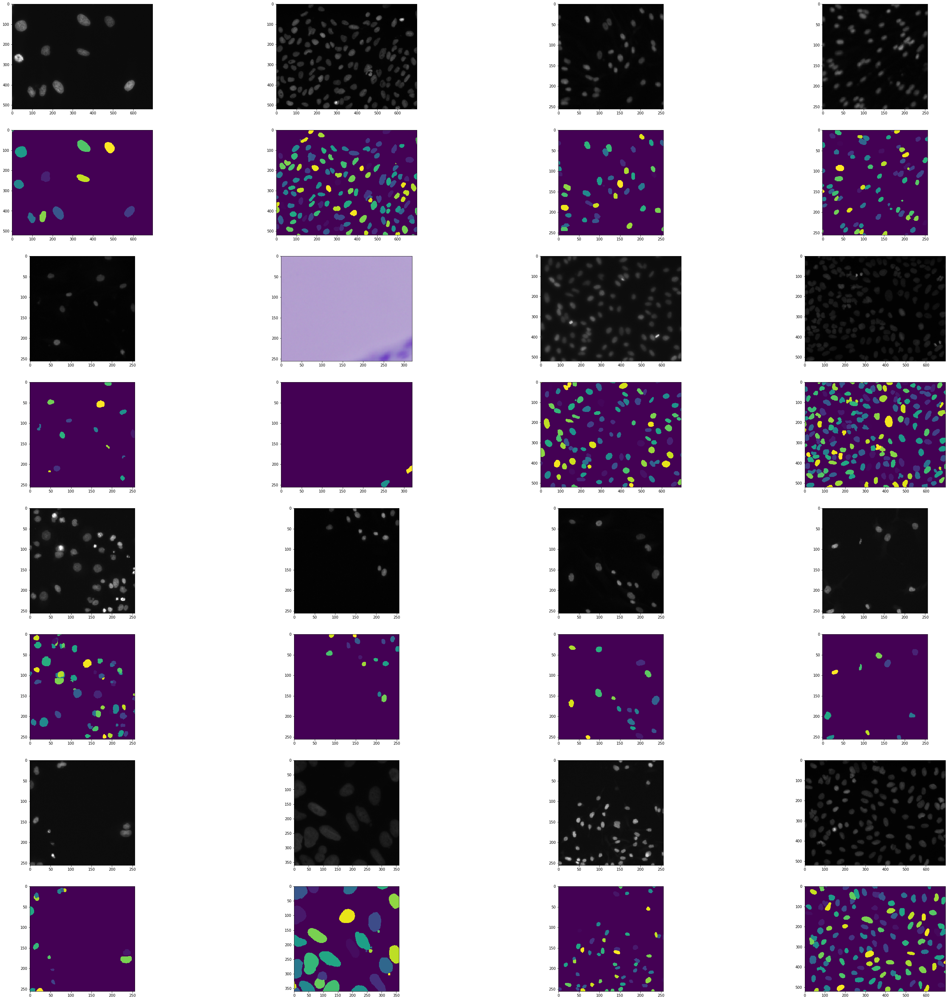

In [15]:
def read_image_labels2(image_id):
    # most of the content in this function is taken from 'Example Metric Implementation' kernel 
    # by 'William Cukierski'
    image_file = "data/bowl18/stage1_train/{}/images/{}.png".format(image_id,image_id)
    mask_file = "data/bowl18/stage1_train/{}/masks/*.png".format(image_id)
    image = skimage.io.imread(image_file)
    masks = skimage.io.imread_collection(mask_file).concatenate()    
    height, width, _ = image.shape
    num_masks = masks.shape[0]
    labels = np.zeros((height, width), np.uint16)
    for index in range(0, num_masks):
        labels[masks[index] > 0] = index + 1
    return image, labels

def plot_images_masks2(image_ids):
    plt.close('all')
    fig, ax = plt.subplots(nrows=8,ncols=4, figsize=(50,50))
    for ax_index, image_id in enumerate(image_ids):
        image, labels = read_image_labels2(image_id)
        img_row, img_col, mask_row, mask_col = int(ax_index/4)*2, ax_index%4, int(ax_index/4)*2 + 1, ax_index%4
        ax[img_row][img_col].imshow(image)
        ax[mask_row][mask_col].imshow(labels)

image_ids = check_output(["ls", "data/bowl18/stage1_train/"]).decode("utf8").split()
print("Total Images in Training set: {}".format(len(image_ids)))
random_image_ids = random.sample(image_ids, 16)
print("Randomly Selected Images: {}, their IDs: {}".format(len(random_image_ids), random_image_ids))
plot_images_masks2(random_image_ids)
    

# Calculate mean nuclei size for each image

In [16]:
def getNucleiSize(image_id):
    mask_file = "data/bowl18/stage1_train/{}/masks/*.png".format(image_id)
    masks = skimage.io.imread_collection(mask_file).concatenate()
    num_masks = masks.shape[0]
    nucleiSize = []
    for index in range(0, num_masks):
        nucleiSize.append(np.sum(masks[index] > 128))
    return np.mean(nucleiSize)

image_ids = check_output(["ls", "data/bowl18/stage1_train/"]).decode("utf8").split()
meanNucleiSizes = []
for image_id in image_ids:
    meanNucleiSizes.append(getNucleiSize(image_id))

# Plot hist of nuclei sizes

26.0 265.4343434343434 7244.071428571428


(array([406., 101.,  26.,  42.,  67.,  23.,   3.,   1.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.]),
 array([  26.        ,  386.90357143,  747.80714286, 1108.71071429,
        1469.61428571, 1830.51785714, 2191.42142857, 2552.325     ,
        2913.22857143, 3274.13214286, 3635.03571429, 3995.93928571,
        4356.84285714, 4717.74642857, 5078.65      , 5439.55357143,
        5800.45714286, 6161.36071429, 6522.26428571, 6883.16785714,
        7244.07142857]),
 <a list of 20 Patch objects>)

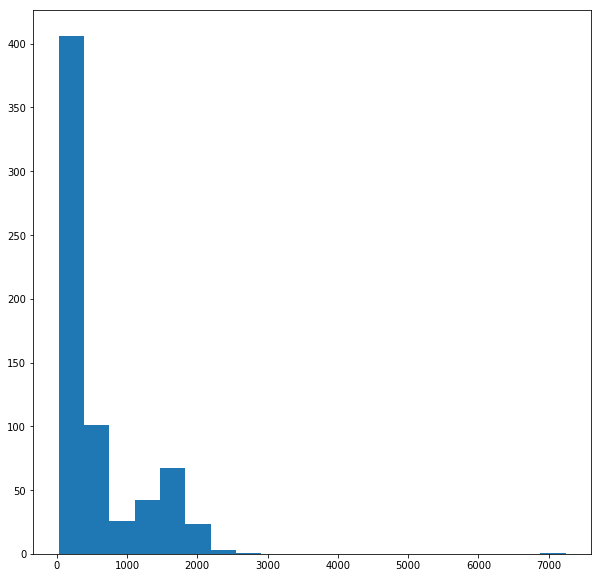

In [17]:
print(np.min(meanNucleiSizes), np.median(meanNucleiSizes), np.max(meanNucleiSizes))
plt.hist(meanNucleiSizes, bins=20)

# Show images with min/mean/median/max size

min size
nuclei size: 26.0


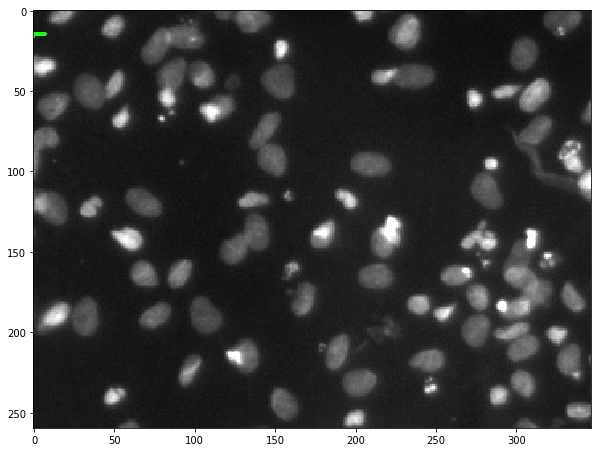

mean size
nuclei size: 560.4834615397524


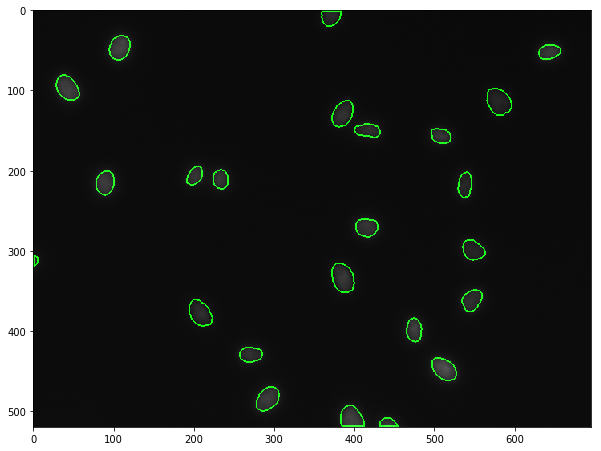

median size
nuclei size: 265.4343434343434


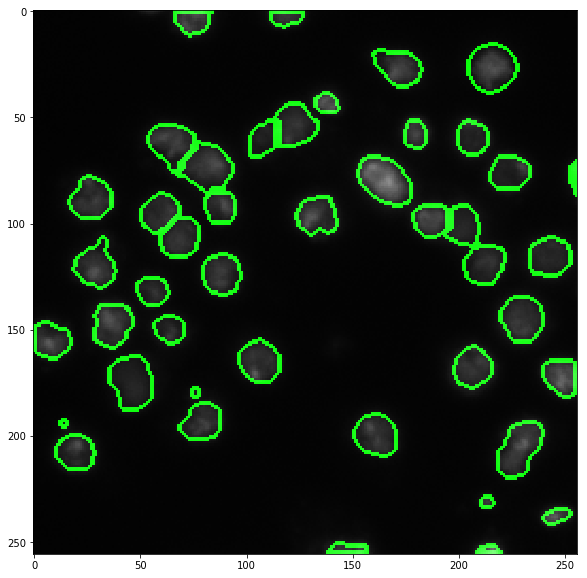

max size
nuclei size: 7244.071428571428


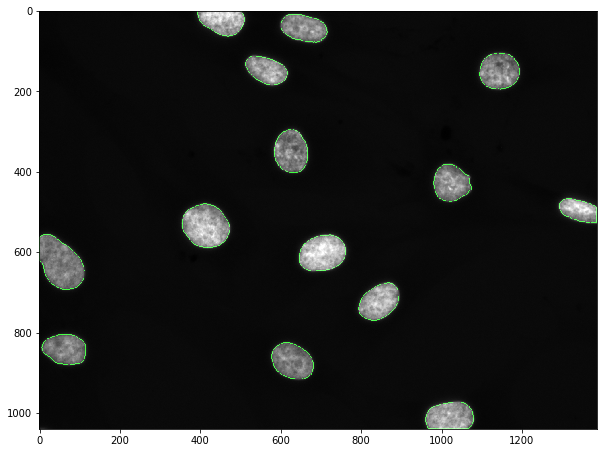

second peak on hist
nuclei size: 1500


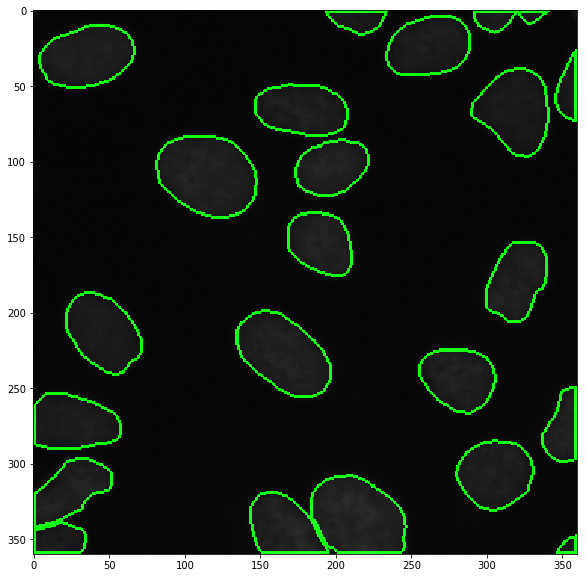

In [18]:
def find_nearest(array,value):
    idx = (np.abs(array-value)).argmin()
    return idx

def read_image_labels(image_id):
    from skimage import morphology
    image_file = "data/bowl18/stage1_train/{}/images/{}.png".format(image_id,image_id)
    mask_file = "data/bowl18/stage1_train/{}/masks/*.png".format(image_id)
    image = skimage.io.imread(image_file)
    masks = skimage.io.imread_collection(mask_file).concatenate()    
    height, width, _ = image.shape
    num_masks = masks.shape[0]
    maxValue = np.max(image)
    kernel = np.matrix([[0,0,1,0,0],
                        [0,1,1,1,0],
                        [1,1,1,1,1],
                        [0,1,1,1,0],
                        [0,0,1,0,0] ], dtype=np.bool)
    for index in range(0, num_masks):
        contour = np.logical_xor(masks[index], morphology.binary_erosion(masks[index], kernel) )
#         image[:,:,0]=0
#         image[:,:,2]=0
        image[:,:,1] |= contour.astype(np.uint8)*255
        #image[contour > 0] = maxValue
    return image


def showImageWithNucleiSize(nucleiSize):
    print('nuclei size:', nucleiSize)
    i = find_nearest(np.asarray(meanNucleiSizes), nucleiSize)
    image_id = image_ids[i]
    plt.imshow(read_image_labels(image_id) )
    plt.show()
    
print('min size')
showImageWithNucleiSize(np.min(meanNucleiSizes))
print('mean size')
showImageWithNucleiSize(np.mean(meanNucleiSizes))
print('median size')
showImageWithNucleiSize(np.median(meanNucleiSizes))
print('max size')
showImageWithNucleiSize(np.max(meanNucleiSizes))
print('second peak on hist')
showImageWithNucleiSize(1500)

# Show first 10 images sorted by nuclei size

7b38c9173ebe69b4c6ba7e703c0c27f39305d9b2910f46405993d2ea7a963b80   26.0


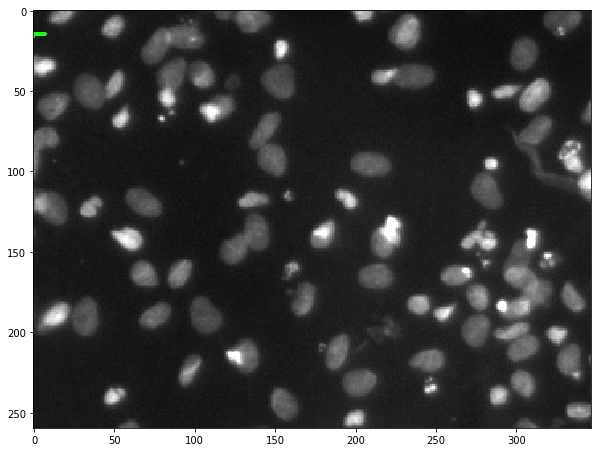

9774c82396327929fea05e40ae153cabf0107178b2ae3e40a5709b409793887e   57.857142857142854


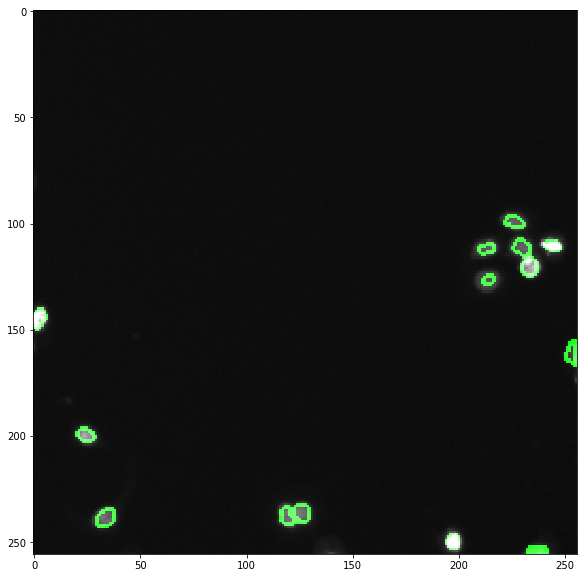

da79a2b105f055ce75404a04bf53bbb51d518d9381af7b4ac714c137f101d920   59.69090909090909


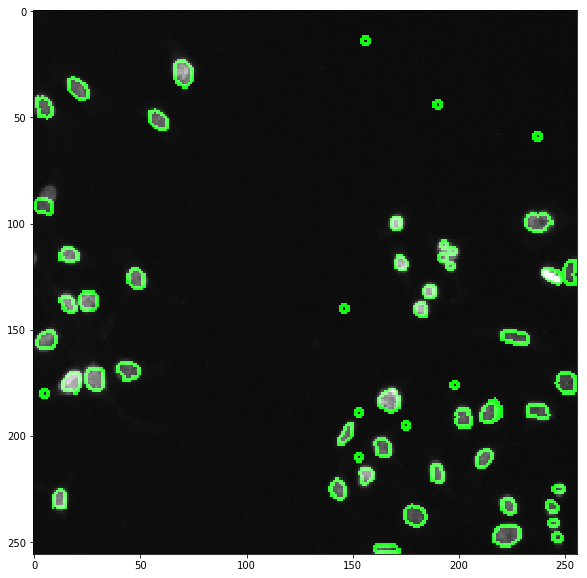

9c95eae11da041189e84cda20bdfb75716a6594684de4b6ce12a9aaadbb874c9   60.05


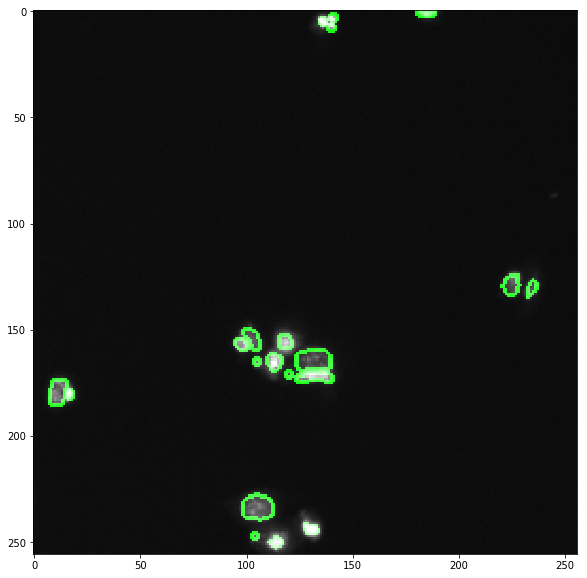

9e4f8ec60a0d622a02c0e16eedcc0101f88ddefbcec2383946c4572b57a1e43a   62.15094339622642


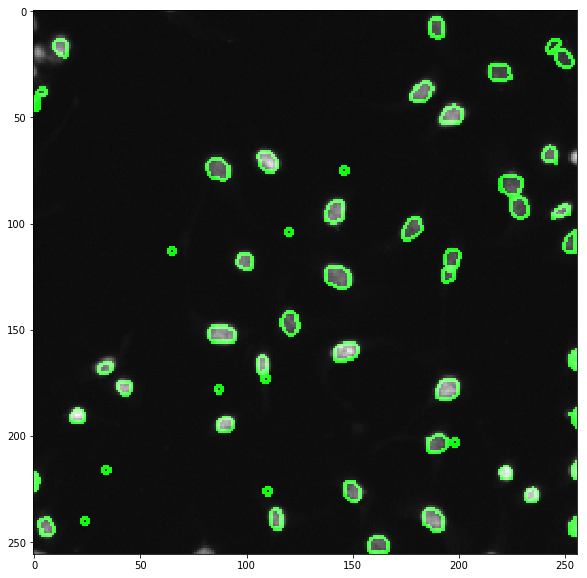

094afe36759e7daffe12188ab5987581d405b06720f1d5acf3f2614f404df380   62.276923076923076


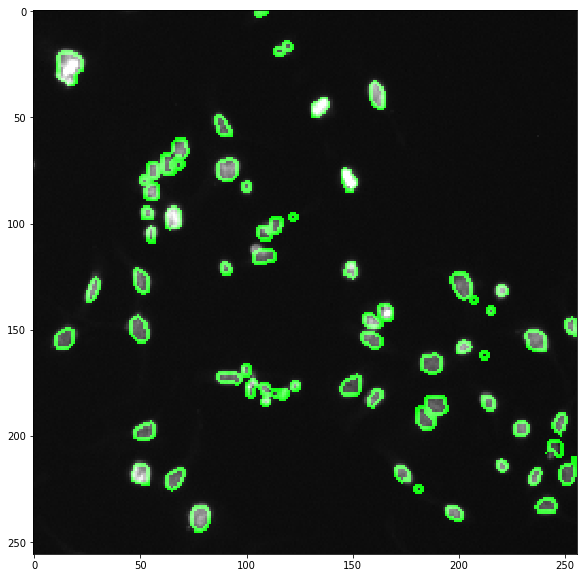

ee927e8255096971ddae1bd975cf80c4ad7c847c82d0b5f5dd2ddfe5407007ee   64.49230769230769


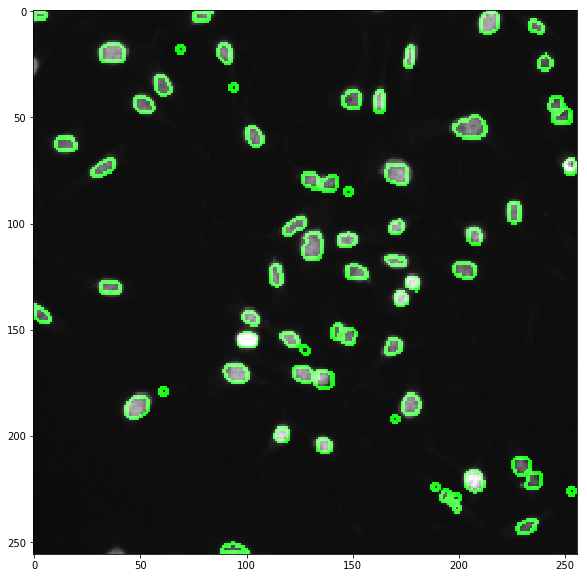

68f833de9f8c631cedd7031b8ed9b908c42cbbc1e14254722728a8b7d596fd4c   66.15625


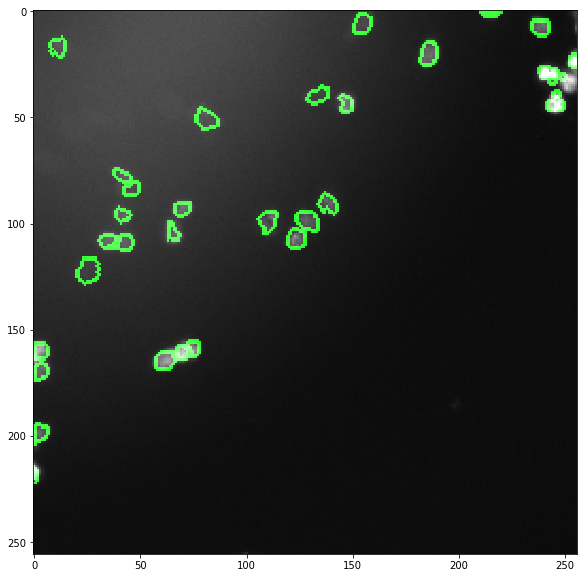

9cbc0700317361236a9fca2eb1f8f79e3a7da17b1970c179cf453921a6136001   66.57142857142857


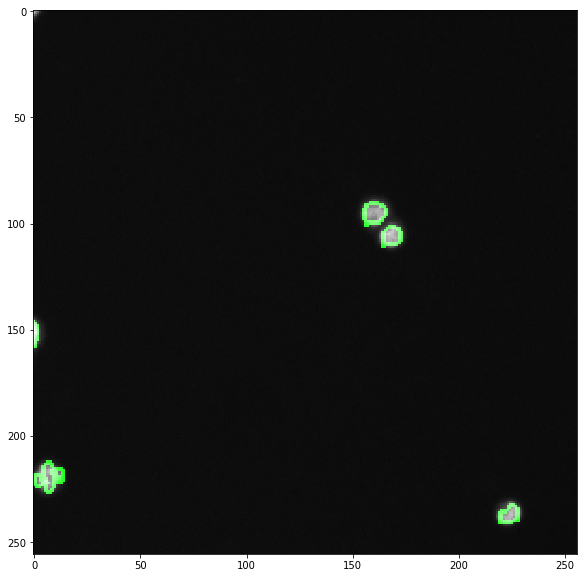

c6216cdc42f61bc345434986db42e2ef9b9741aee3210b7a808e952e319d2305   67.84375


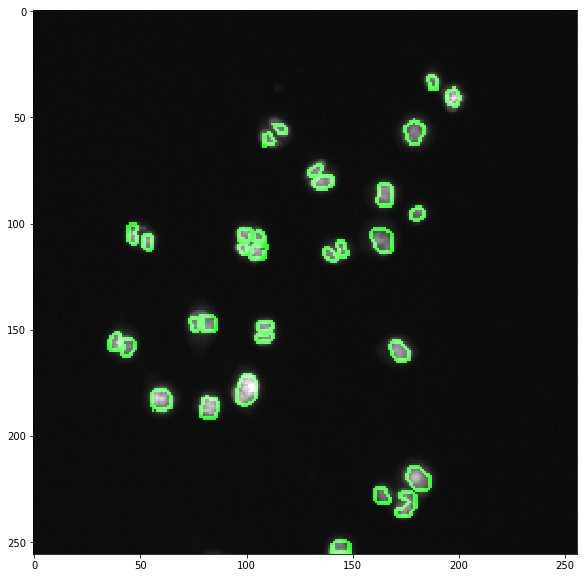

In [19]:
ids = np.argsort(meanNucleiSizes)[0:10]
for i in ids:
    image_id = image_ids[i]
    print(image_id, ' ', meanNucleiSizes[i])
    plt.imshow(read_image_labels(image_id))
    plt.show()

# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #

# Method 3

## Read the image and find appropriate filter settings

In [21]:
import cv2

ID = '0a7d30b252359a10fd298b638b90cb9ada3acced4e0c0e5a3692013f432ee4e9'
FILE = "data/bowl18/stage1_train/{}/images/{}.png".format(ID,ID)


img = cv2.imread(FILE,0)

# Otsu's thresholding after Gaussian filtering
blur = cv2.GaussianBlur(img,(5,5),0)
ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

# Plot the filtering process

(Text(0.5,1,"Otsu's Thresholding"),
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

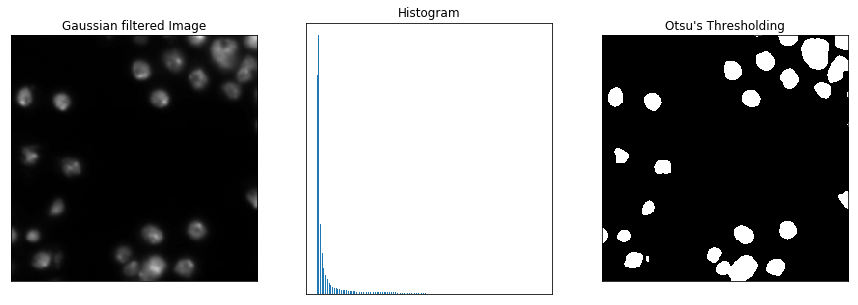

In [23]:
# Plot Here
plt.figure(figsize=(15,5))
images = [blur, 0, th3]
titles = ['Gaussian filtered Image','Histogram',"Otsu's Thresholding"]
plt.subplot(1,3,1),plt.imshow(images[0],'gray')
plt.title(titles[0]), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,2),plt.hist(images[0].ravel(),256)
plt.title(titles[1]), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,3),plt.imshow(images[2],'gray')
plt.title(titles[2]), plt.xticks([]), plt.yticks([])

# Count the number of contours in the filtered image

number of detected contours:  29


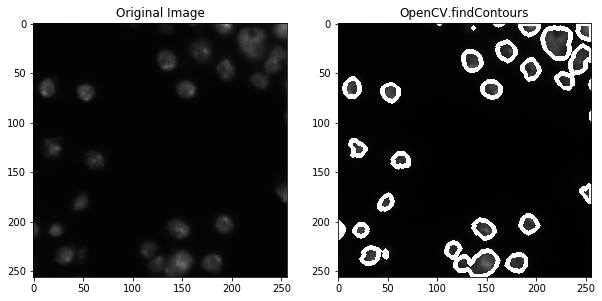

In [24]:
im = cv2.imread(FILE)
imgray = cv2.cvtColor(im,cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
image, contours, hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
img = cv2.drawContours(img, contours, -1, (255,255,255), 3)
plt.figure(figsize=(10,10))
plt.subplot(1,2,1),plt.title('Original Image'),plt.imshow(im)#,'red')
plt.subplot(1,2,2),plt.title('OpenCV.findContours'),plt.imshow(img,'gray')#,'red')

print('number of detected contours: ',len(contours))

# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # 

# Method 4

In [25]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from glob import glob
import os
from skimage.io import imread
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
dsb_data_dir = os.path.join('..', 'input')
stage_label = 'stage1'

In [26]:
all_images = glob(os.path.join(dsb_data_dir, 'stage1_*', '*', '*', '*.png'))
img_df = pd.DataFrame({'path': all_images})
img_id = lambda in_path: in_path.split('/')[-3]
img_type = lambda in_path: in_path.split('/')[-2]
img_group = lambda in_path: in_path.split('/')[-4].split('_')[1]
img_stage = lambda in_path: in_path.split('/')[-4].split('_')[0]
img_df['ImageId'] = img_df['path'].map(img_id)
img_df['ImageType'] = img_df['path'].map(img_type)
img_df['TrainingSplit'] = img_df['path'].map(img_group)
img_df['Stage'] = img_df['path'].map(img_stage)
# we don't want any masks
img_df = img_df.query('ImageType=="images"').drop(['ImageType'],1)
img_df.sample(2)

,path,ImageId,TrainingSplit,Stage
26218,../input/stage1_train/139946af9e2c7ef4f0298e62...,139946af9e2c7ef4f0298e622b831dbef5e5c0cd088eb5...,train,stage1
9920,../input/stage1_train/2ab91a4408860ae8339689ed...,2ab91a4408860ae8339689ed9f87aa9359de1bdd4ca5c2...,train,stage1


# Load in all the data

In [27]:
%%time
img_df['images'] = img_df['path'].map(imread)
img_df.drop(['path'],1, inplace = True)
img_df.sample(1)

CPU times: user 2.76 s, sys: 160 ms, total: 2.92 s
Wall time: 2.96 s


# Create Color Features

Here we create color features and see if there are any differences betweeen our training and testing sets


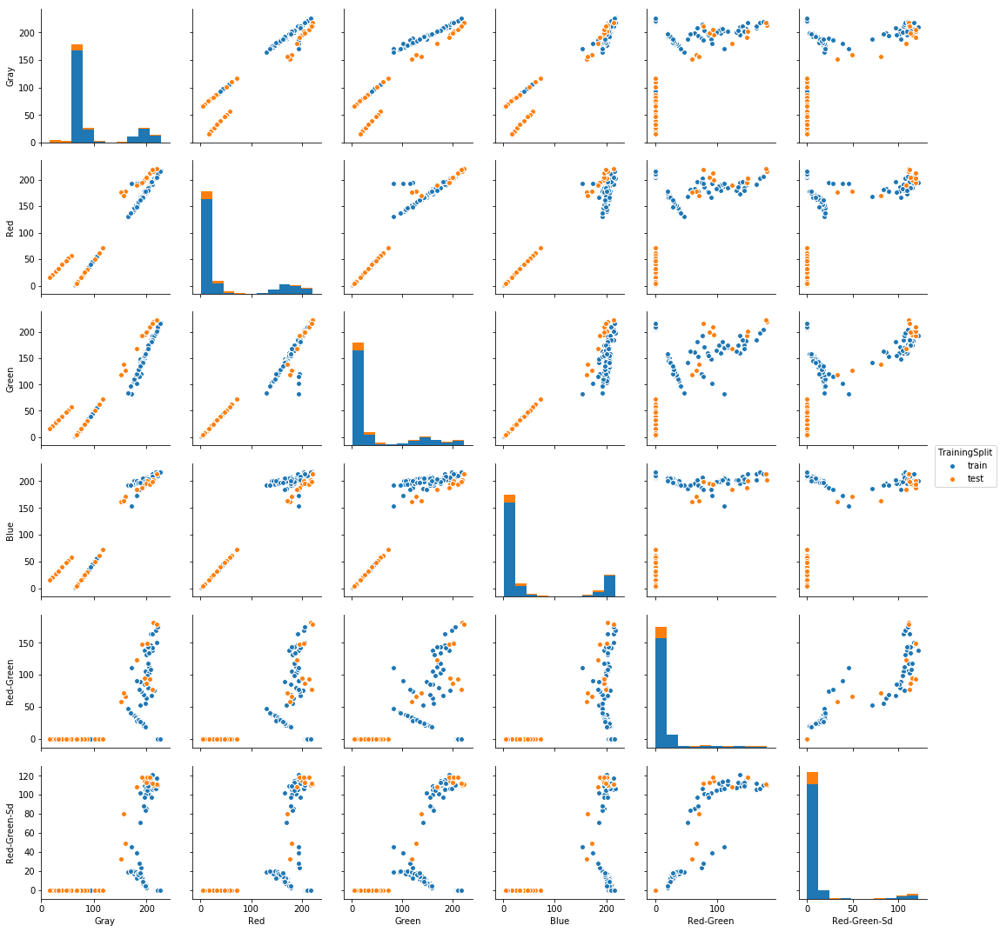

In [28]:
color_features_names = ['Gray', 'Red', 'Green', 'Blue', 'Red-Green',  'Red-Green-Sd']
def create_color_features(in_df):
    in_df['Red'] = in_df['images'].map(lambda x: np.mean(x[:,:,0]))
    in_df['Green'] = in_df['images'].map(lambda x: np.mean(x[:,:,1]))
    in_df['Blue'] = in_df['images'].map(lambda x: np.mean(x[:,:,2]))
    in_df['Gray'] = in_df['images'].map(lambda x: np.mean(x))
    in_df['Red-Green'] = in_df['images'].map(lambda x: np.mean(x[:,:,0]-x[:,:,1]))
    in_df['Red-Green-Sd'] = in_df['images'].map(lambda x: np.std(x[:,:,0]-x[:,:,1]))
    return in_df

img_df = create_color_features(img_df)
sns.pairplot(img_df[color_features_names+['TrainingSplit']], 
             hue = 'TrainingSplit')

We see that there are definitely some types of images in our data which are different between the training and testing. We also see there are a number of different types of groups

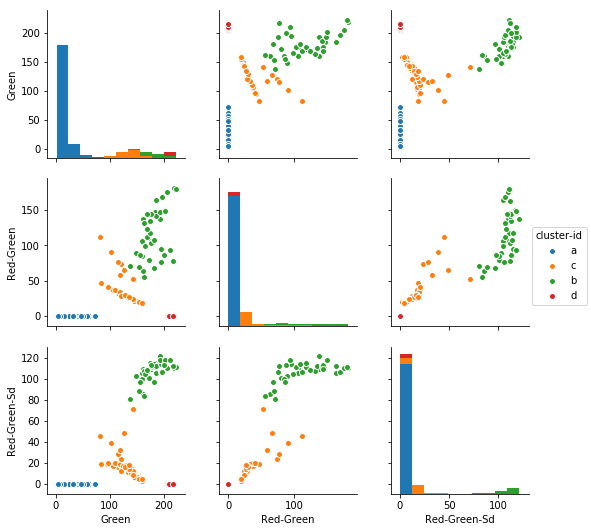

In [29]:
from sklearn.cluster import KMeans
from string import ascii_lowercase

def create_color_cluster(in_df, cluster_maker = None, cluster_count = 3):
    if cluster_maker is None:
        cluster_maker = KMeans(cluster_count)
        cluster_maker.fit(in_df[['Green', 'Red-Green', 'Red-Green-Sd']])
        
    in_df['cluster-id'] = np.argmin(
        cluster_maker.transform(in_df[['Green', 'Red-Green', 'Red-Green-Sd']]),
        -1)
    in_df['cluster-id'] = in_df['cluster-id'].map(lambda x: ascii_lowercase[x])
    return in_df, cluster_maker

img_df, train_cluster_maker = create_color_cluster(img_df, cluster_count=4)
sns.pairplot(img_df,
             vars = ['Green', 'Red-Green', 'Red-Green-Sd'], 
             hue = 'cluster-id')

# Show Sample Images

Here we show some sample images from each group


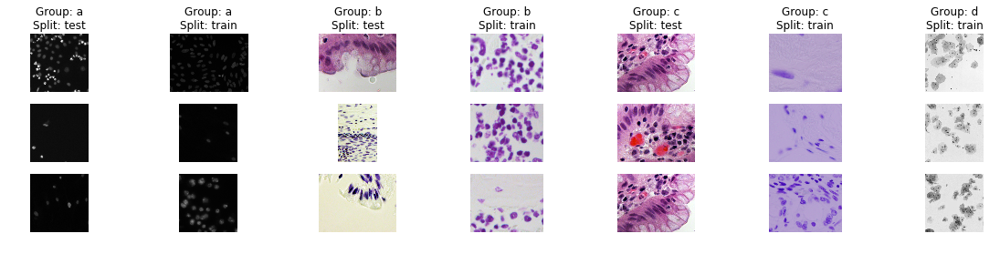

In [30]:
n_img = 3
grouper = img_df.groupby(['cluster-id', 'TrainingSplit'])
fig, m_axs = plt.subplots(n_img, len(grouper), 
                          figsize = (20, 4))
for (c_group, clus_group), c_ims in zip(grouper, 
                                     m_axs.T):
    c_ims[0].set_title('Group: {}\nSplit: {}'.format(*c_group))
    for (_, clus_row), c_im in zip(clus_group.sample(n_img, replace = True).iterrows(), c_ims):
        c_im.imshow(clus_row['images'])
        c_im.axis('off')
fig.savefig('messy_overview.png')


So we evidently have more than 4 groups and the testing and training data look very, very different

# Experimental Subset

Here we make a small subset of the data to experiment with


In [31]:
tiny_img_df = grouper.apply(lambda x: x.sample(n_img if n_img<x.shape[0] else x.shape[0])
                           ).reset_index(drop=True).drop(color_features_names, 1).sort_values(['cluster-id', 'TrainingSplit'])
print(tiny_img_df.shape[0], 'images to experiment with')
tiny_img_df.sample(2)

20 images to experiment with


,ImageId,TrainingSplit,Stage,images,cluster-id
0,53df5150ee56253fe5bc91a9230d377bb21f1300f443ba...,test,stage1,"[[[3, 3, 3, 255], [3, 3, 3, 255], [3, 3, 3, 25...",a
11,7f55678298adb736987d9fb5d1d2daefb08fe5bf4d81b2...,train,stage1,"[[[162, 135, 196, 255], [163, 131, 190, 255], ...",b


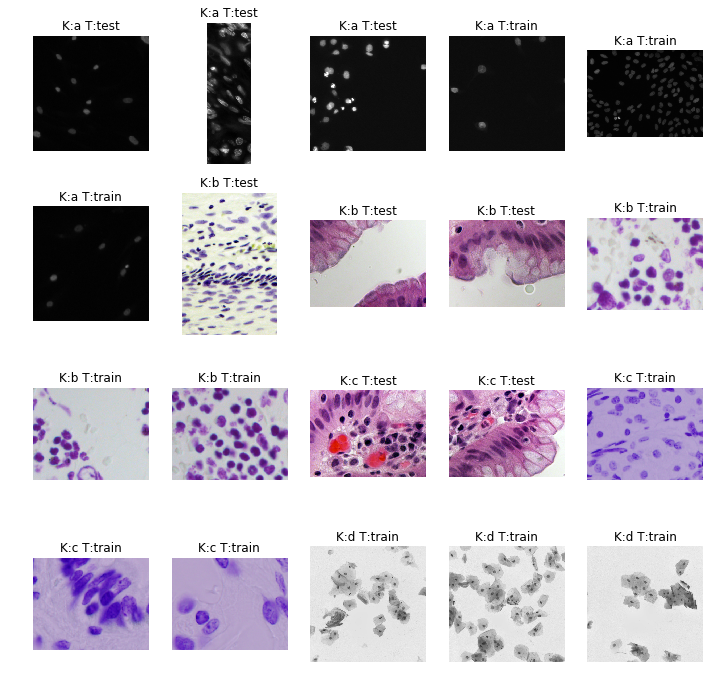

In [32]:
def show_test_img(in_df, in_col):
    plt_cols = tiny_img_df.shape[0]//4
    fig, m_axs = plt.subplots(4, plt_cols, figsize = (12, 12))
    for c_ax, (_, c_row) in zip(m_axs.flatten(), in_df.iterrows()):
        c_ax.imshow(c_row[in_col])
        c_ax.axis('off')
        c_ax.set_title('K:{cluster-id} T:{TrainingSplit}'.format(**c_row))
show_test_img(tiny_img_df, 'images')

# Histogram Equalization

Does histogram equalization help us? For this we use CLAHE on the RGB data,


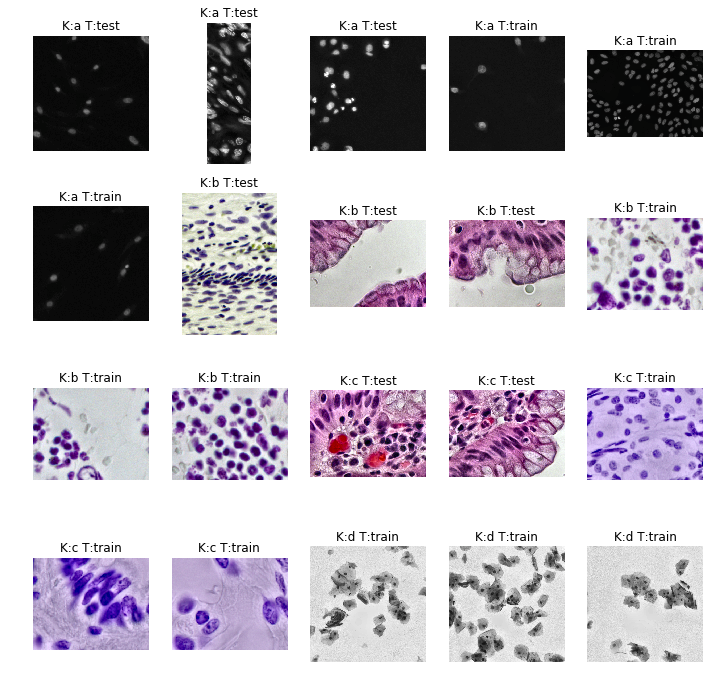

In [33]:
import cv2
grid_size = 8
def rgb_clahe(in_rgb_img): 
    bgr = in_rgb_img[:,:,[2,1,0]] # flip r and b
    lab = cv2.cvtColor(bgr, cv2.COLOR_BGR2LAB)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(grid_size,grid_size))
    lab[:,:,0] = clahe.apply(lab[:,:,0])
    bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
    return bgr[:,:,[2,1,0]]

tiny_img_df['clahe_lab'] = tiny_img_df['images'].map(rgb_clahe)

show_test_img(tiny_img_df, 'clahe_lab')

# Just extract L?

Instead of recreating the color image maybe just keep the L channel


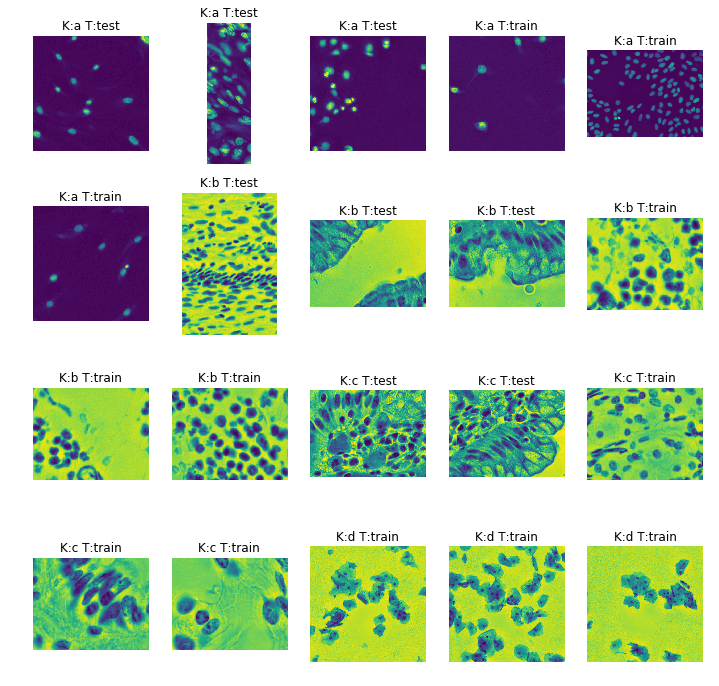

In [34]:
def rgb_clahe_justl(in_rgb_img): 
    bgr = in_rgb_img[:,:,[2,1,0]] # flip r and b
    lab = cv2.cvtColor(bgr, cv2.COLOR_BGR2LAB)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(grid_size,grid_size))
    return clahe.apply(lab[:,:,0])
tiny_img_df['clahe_justl'] = tiny_img_df['images'].map(rgb_clahe_justl)

show_test_img(tiny_img_df, 'clahe_justl')

# Invert if the intensity/background is too high?

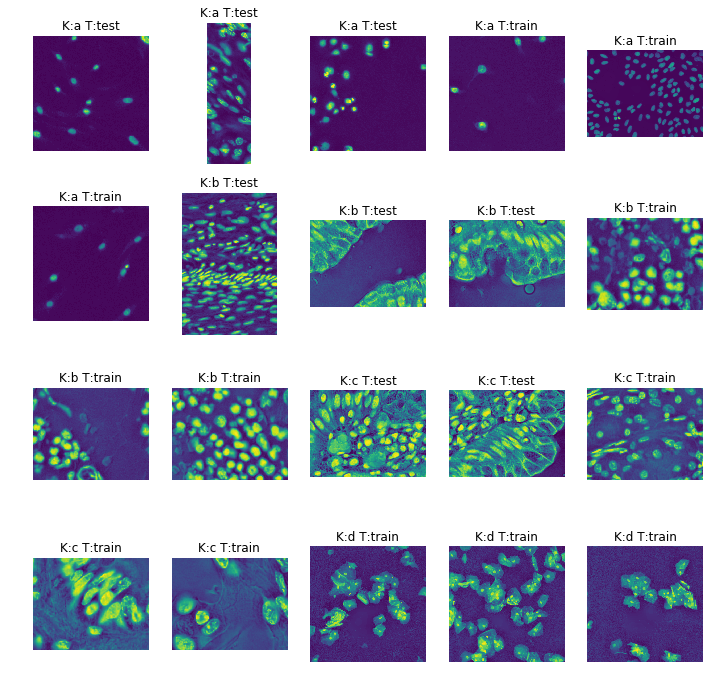

In [35]:
tiny_img_df['clahe_justl_flip'] = tiny_img_df['clahe_justl'].map(lambda x: 255-x if x.mean()>127 else x)

show_test_img(tiny_img_df, 'clahe_justl_flip')